In [1]:
from dask.distributed import Client

In [2]:
client = Client(threads_per_worker=1)

In [3]:
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 12
Total threads: 12,Total memory: 46.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40723,Workers: 12
Dashboard: /proxy/8787/status,Total threads: 12
Started: Just now,Total memory: 46.00 GiB
Comm: tcp://127.0.0.1:34795,Total threads: 1
Dashboard: /proxy/43157/status,Memory: 3.83 GiB
Nanny: tcp://127.0.0.1:37063,


In [4]:
import xarray as xr
import matplotlib.pyplot as plt

In [5]:
cd /g/data/tm70/as2285/om3-scripts/expts_manager/test/advection_upwind/archive/output000

/scratch/tm70/as2285/access-om3/archive/advection_upwind-perturb-7160a35a/output000


In [6]:
ls

access-om3.cice.1901-03.nc
access-om3.cice_inst.1901-03-01-01350.nc
access-om3.cice_inst.1901-03-01-02700.nc
access-om3.cice_inst.1901-03-01-04050.nc
access-om3.cice_inst.1901-03-01-05400.nc
access-om3.cice_inst.1901-03-01-06750.nc
access-om3.cice_inst.1901-03-01-08100.nc
access-om3.cice_inst.1901-03-01-09450.nc
access-om3.cice_inst.1901-03-01-10800.nc
access-om3.cice_inst.1901-03-01-12150.nc
access-om3.cice_inst.1901-03-01-13500.nc
access-om3.cice_inst.1901-03-01-14850.nc
access-om3.cice_inst.1901-03-01-16200.nc
access-om3.cice_inst.1901-03-01-17550.nc
access-om3.cice_inst.1901-03-01-18900.nc
access-om3.cice_inst.1901-03-01-20250.nc
access-om3.cice_inst.1901-03-01-21600.nc
access-om3.cice_inst.1901-03-01-22950.nc
access-om3.cice_inst.1901-03-01-24300.nc
access-om3.cice_inst.1901-03-01-25650.nc
access-om3.cice_inst.1901-03-01-27000.nc
access-om3.cice_inst.1901-03-01-28350.nc
access-om3.cice_inst.1901-03-01-29700.nc
access-om3.cice_inst.1901-03-01-31050.nc
access-om3.cice_inst.1901-03-0

In [41]:
! grep upwind ice_in

    advection = upwind


In [43]:
! grep DT MOM_input

DT = 1350.0                     !   [s]
                                ! be an integer fraction of the forcing time-step (DT_FORCING in ocean-only mode
DT_THERM = 1350.0               !   [s] default = 1800.0
                                ! The thermodynamic and tracer advection time step. Ideally DT_THERM should be
                                ! an integer multiple of DT and less than the forcing or coupling time-step,
                                ! unless THERMO_SPANS_COUPLING is true, in which case DT_THERM can be an integer
                                ! multiple of the coupling timestep.  By default DT_THERM is set to DT.
DTBT_RESET_PERIOD = 0.0         !   [s] default = 3600.0
                                ! The period between recalculations of DTBT (if DTBT <= 0). If DTBT_RESET_PERIOD
                                ! is negative, DTBT is set based only on information available at
                                ! initialization.  If 0, DTBT will be set every dynam

In [44]:
! cat nuopc.runseq

runSeq:: 
@1350 
  MED med_phases_aofluxes_run
  MED med_phases_prep_ocn_accum
  MED med_phases_ocnalb_run
  MED med_phases_diag_ocn
  MED med_phases_prep_ice
  MED -> ICE :remapMethod=redist
  MED med_phases_prep_ocn_avg
  MED -> OCN :remapMethod=redist
  ICE
  ROF
  OCN
  OCN -> MED :remapMethod=redist
  MED med_phases_post_ocn
  MED med_phases_diag_rof
  MED med_phases_diag_ice_ice2med
  ICE -> MED :remapMethod=redist
  MED med_phases_post_ice
  ATM
  ATM -> MED :remapMethod=redist
  MED med_phases_post_atm
  MED med_phases_diag_atm
  MED med_phases_diag_ice_med2ice
  ROF -> MED :remapMethod=redist
  MED med_phases_post_rof
  MED med_phases_diag_accum
  MED med_phases_diag_print
  MED med_phases_history_write        
  MED med_phases_restart_write        
  MED med_phases_profile              
@ 
::


In [7]:
cice_files = ! ls access-om3.cice.*.nc

In [8]:
cice_files

['access-om3.cice.1901-03.nc']

In [9]:
cice_ds = xr.open_mfdataset(cice_files)

In [10]:
cice_ds

<xarray.Dataset> Size: 16GB
Dimensions:      (time: 31, nbnd: 2, nc: 5, nkice: 4, nksnow: 1, nkbio: 3,
                  nkaer: 5, nj: 1080, ni: 1440)
Coordinates:
  * time         (time) object 248B 1901-03-01 12:00:00 ... 1901-03-31 12:00:00
Dimensions without coordinates: nbnd, nc, nkice, nksnow, nkbio, nkaer, nj, ni
Data variables: (12/51)
    time_bounds  (time, nbnd) object 496B dask.array<chunksize=(1, 2), meta=np.ndarray>
    NCAT         (nc) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    VGRDi        (nkice) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    VGRDs        (nksnow) float64 8B dask.array<chunksize=(1,), meta=np.ndarray>
    VGRDb        (nkbio) float64 24B dask.array<chunksize=(3,), meta=np.ndarray>
    VGRDa        (nkaer) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    ...           ...
    strintyE     (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    dvidtt       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    dvidtd       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    hisnap       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    aisnap       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    sifb         (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
Attributes:
    title:               access-om3
    contents:            Diagnostic and Prognostic Variables
    source:              CICE Sea Ice Model, unknown_version_name
    comment:             All years have exactly 365 days
    comment2:            File written on model date 19010302
    comment3:            seconds elapsed into model date:      0
    time_period_freq:    day_1
    time_axis_position:  middle
    conventions:         CF-1.0
    history:             Wed Nov  6 12:05:32 2024: ncrcat -O -L 5 -4 archive/...
    io_flavor:           io_pio2 hdf5
    NCO:                 netCDF Operators version 5.0.5 (Homepage = http://nc...

In [11]:
crash_point = cice_ds.isel(ni=1068,nj=1001)

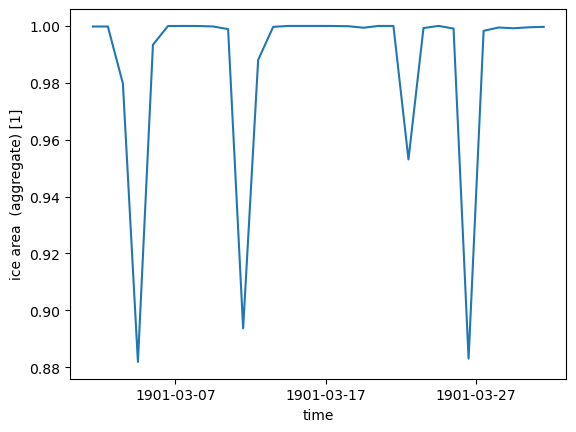

In [12]:
crash_point.aice.plot()

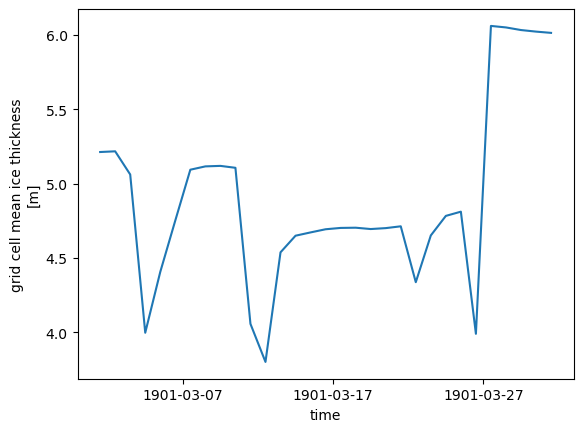

In [13]:
crash_point.hi.plot()

In [14]:
grid_ds = xr.open_dataset('/g/data/ik11/grids/ocean_grid_025.nc')

In [15]:
grid_ds

<xarray.Dataset> Size: 93MB
Dimensions:     (xt_ocean: 1440, yt_ocean: 1080, time: 1, xu_ocean: 1440,
                 yu_ocean: 1080)
Coordinates:
  * xt_ocean    (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean    (yt_ocean) float64 9kB -81.08 -80.97 -80.87 ... 89.84 89.95
  * time        (time) object 8B 0002-01-01 00:00:00
  * xu_ocean    (xu_ocean) float64 12kB -279.8 -279.5 -279.2 ... 79.5 79.75 80.0
  * yu_ocean    (yu_ocean) float64 9kB -81.02 -80.92 -80.81 ... 89.79 89.89 90.0
    geolon_t    (yt_ocean, xt_ocean) float32 6MB ...
    geolat_t    (yt_ocean, xt_ocean) float32 6MB ...
    geolon_c    (yu_ocean, xu_ocean) float32 6MB ...
    geolat_c    (yu_ocean, xu_ocean) float32 6MB ...
Data variables:
    ht          (yt_ocean, xt_ocean) float32 6MB ...
    hu          (yu_ocean, xu_ocean) float32 6MB ...
    dxt         (yt_ocean, xt_ocean) float32 6MB ...
    dyt         (yt_ocean, xt_ocean) float32 6MB ...
    dxu         (yu_ocean, xu_ocean) float32 6MB ...
    dyu         (yu_ocean, xu_ocean) float32 6MB ...
    area_t      (yt_ocean, xt_ocean) float32 6MB ...
    area_u      (yu_ocean, xu_ocean) float32 6MB ...
    kmt         (yt_ocean, xt_ocean) float32 6MB ...
    kmu         (yu_ocean, xu_ocean) float32 6MB ...
    drag_coeff  (time, yu_ocean, xu_ocean) float32 6MB ...
Attributes:
    filename:   ocean_grid.nc
    title:      MOM5
    grid_type:  mosaic
    grid_tile:  1

In [16]:
grid_ds=grid_ds.rename({'xt_ocean':'ni', 'yt_ocean':'nj'})

In [17]:
cice_ds['TLON']=grid_ds['geolon_t']

In [18]:
cice_ds['TLAT']=grid_ds['geolat_t']

In [19]:
cice_ds

<xarray.Dataset> Size: 16GB
Dimensions:      (time: 31, nbnd: 2, nc: 5, nkice: 4, nksnow: 1, nkbio: 3,
                  nkaer: 5, nj: 1080, ni: 1440)
Coordinates:
  * time         (time) object 248B 1901-03-01 12:00:00 ... 1901-03-31 12:00:00
  * ni           (ni) float64 12kB -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
  * nj           (nj) float64 9kB -81.08 -80.97 -80.87 ... 89.74 89.84 89.95
    geolon_t     (nj, ni) float32 6MB ...
    geolat_t     (nj, ni) float32 6MB ...
Dimensions without coordinates: nbnd, nc, nkice, nksnow, nkbio, nkaer
Data variables: (12/53)
    time_bounds  (time, nbnd) object 496B dask.array<chunksize=(1, 2), meta=np.ndarray>
    NCAT         (nc) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    VGRDi        (nkice) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    VGRDs        (nksnow) float64 8B dask.array<chunksize=(1,), meta=np.ndarray>
    VGRDb        (nkbio) float64 24B dask.array<chunksize=(3,), meta=np.ndarray>
    VGRDa        (nkaer) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    ...           ...
    dvidtd       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    hisnap       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    aisnap       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    sifb         (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    TLON         (nj, ni) float32 6MB ...
    TLAT         (nj, ni) float32 6MB ...
Attributes:
    title:               access-om3
    contents:            Diagnostic and Prognostic Variables
    source:              CICE Sea Ice Model, unknown_version_name
    comment:             All years have exactly 365 days
    comment2:            File written on model date 19010302
    comment3:            seconds elapsed into model date:      0
    time_period_freq:    day_1
    time_axis_position:  middle
    conventions:         CF-1.0
    history:             Wed Nov  6 12:05:32 2024: ncrcat -O -L 5 -4 archive/...
    io_flavor:           io_pio2 hdf5
    NCO:                 netCDF Operators version 5.0.5 (Homepage = http://nc...

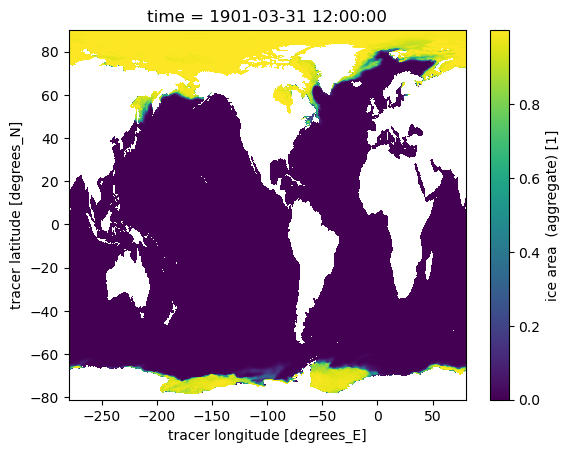

In [20]:
ax = plt.subplot()

cice_ds.aice.isel(time=-1).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t' )

ax.add_patch(plt.Rectangle((1064,996),width=10, height=10, color='red', fill=None))

plt.show()

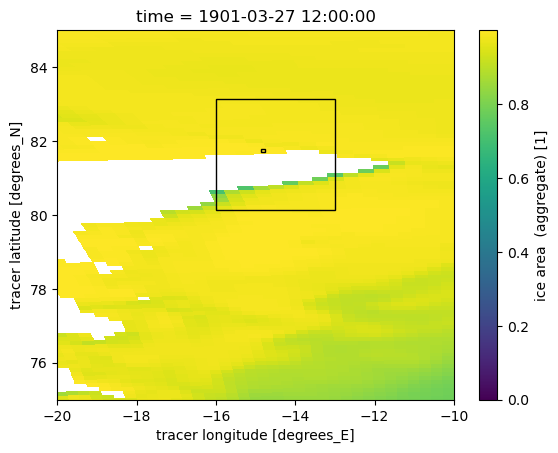

In [21]:
plt.figure()
ax = plt.subplot()

cice_ds.aice.isel(time=26).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t')
plt.ylim([75,85])
plt.xlim([-20,-10])

ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='black', fill=None))
ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.1, height=0.1, color='black', fill=None))


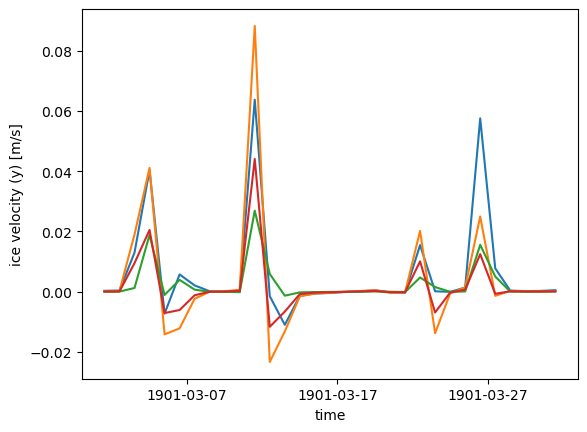

In [22]:
for v in ['uvel','vvel', 'uvelE', 'vvelE']:
    crash_point[v].plot()

# And with the inst output

In [23]:
inst_files = ! ls access-om3.cice_inst.1901-03-*.nc

In [24]:
inst_files

['access-om3.cice_inst.1901-03-01-01350.nc',
 'access-om3.cice_inst.1901-03-01-02700.nc',
 'access-om3.cice_inst.1901-03-01-04050.nc',
 'access-om3.cice_inst.1901-03-01-05400.nc',
 'access-om3.cice_inst.1901-03-01-06750.nc',
 'access-om3.cice_inst.1901-03-01-08100.nc',
 'access-om3.cice_inst.1901-03-01-09450.nc',
 'access-om3.cice_inst.1901-03-01-10800.nc',
 'access-om3.cice_inst.1901-03-01-12150.nc',
 'access-om3.cice_inst.1901-03-01-13500.nc',
 'access-om3.cice_inst.1901-03-01-14850.nc',
 'access-om3.cice_inst.1901-03-01-16200.nc',
 'access-om3.cice_inst.1901-03-01-17550.nc',
 'access-om3.cice_inst.1901-03-01-18900.nc',
 'access-om3.cice_inst.1901-03-01-20250.nc',
 'access-om3.cice_inst.1901-03-01-21600.nc',
 'access-om3.cice_inst.1901-03-01-22950.nc',
 'access-om3.cice_inst.1901-03-01-24300.nc',
 'access-om3.cice_inst.1901-03-01-25650.nc',
 'access-om3.cice_inst.1901-03-01-27000.nc',
 'access-om3.cice_inst.1901-03-01-28350.nc',
 'access-om3.cice_inst.1901-03-01-29700.nc',
 'access-o

In [25]:
inst_ds = xr.open_mfdataset(inst_files)

In [26]:
inst_ds['TLON']=grid_ds['geolon_t']

In [27]:
inst_ds['TLAT']=grid_ds['geolat_t']

In [28]:
crash_point = inst_ds.isel(ni=1068,nj=1001)

In [29]:
crash_point

<xarray.Dataset> Size: 587kB
Dimensions:      (time: 1983, nbnd: 2, nkice: 4, nksnow: 1, nkbio: 3, nkaer: 5,
                  nc: 5)
Coordinates:
  * time         (time) object 16kB 1901-03-01 00:11:15 ... 1901-03-31 23:26:15
    NCAT         (nc) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    ni           float64 8B -12.88
    nj           float64 8B 81.71
    geolon_t     float32 4B ...
    geolat_t     float32 4B ...
Dimensions without coordinates: nbnd, nkice, nksnow, nkbio, nkaer, nc
Data variables: (12/24)
    time_bounds  (time, nbnd) object 32kB dask.array<chunksize=(1, 2), meta=np.ndarray>
    VGRDi        (time, nkice) float64 63kB dask.array<chunksize=(1, 4), meta=np.ndarray>
    VGRDs        (time, nksnow) float64 16kB dask.array<chunksize=(1, 1), meta=np.ndarray>
    VGRDb        (time, nkbio) float64 48kB dask.array<chunksize=(1, 3), meta=np.ndarray>
    VGRDa        (time, nkaer) float64 79kB dask.array<chunksize=(1, 5), meta=np.ndarray>
    blkmask      (time) float64 16kB dask.array<chunksize=(1,), meta=np.ndarray>
    ...           ...
    frazil_1     (time) float64 16kB dask.array<chunksize=(1,), meta=np.ndarray>
    dvidtt_1     (time) float64 16kB dask.array<chunksize=(1,), meta=np.ndarray>
    dvidtd_1     (time) float64 16kB dask.array<chunksize=(1,), meta=np.ndarray>
    aicen_1      (time, nc) float64 79kB dask.array<chunksize=(1, 2), meta=np.ndarray>
    TLON         float32 4B ...
    TLAT         float32 4B ...
Attributes:
    title:               access-om3
    contents:            Diagnostic and Prognostic Variables
    source:              CICE Sea Ice Model, unknown_version_name
    comment:             All years have exactly 365 days
    comment2:            File written on model date 19010301
    comment3:            seconds elapsed into model date:   1350
    time_period_freq:    step_1
    time_axis_position:  middle
    conventions:         CF-1.0
    history:             This dataset was created on 2024-11-06 at 10:36
    io_flavor:           io_pio2 hdf5

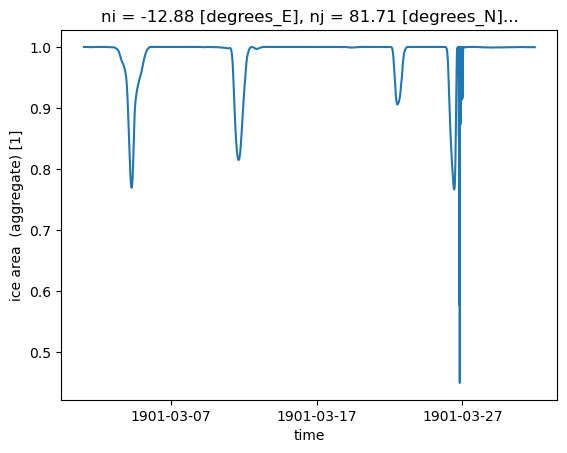

In [30]:
crash_point.aice_1.plot()

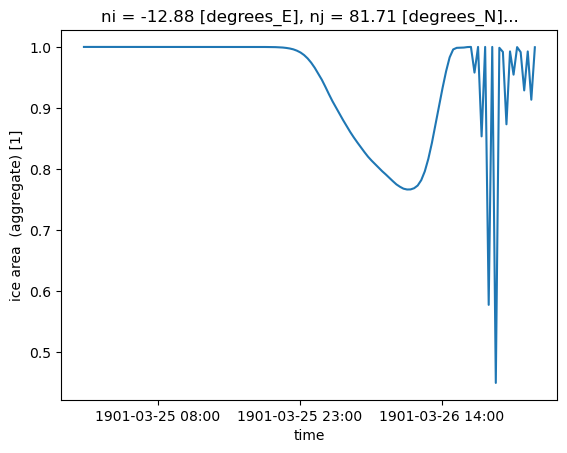

In [31]:
crash_point.sel(time=slice('1901-03-25','1901-03-26')).aice_1.plot()

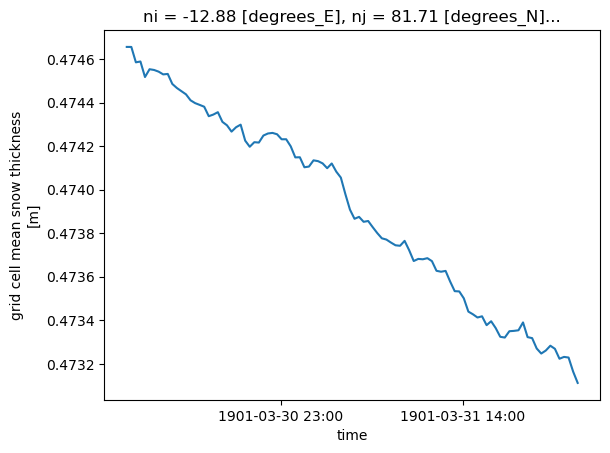

In [32]:
crash_point.isel(time=slice(-100,None)).hs_1.plot()

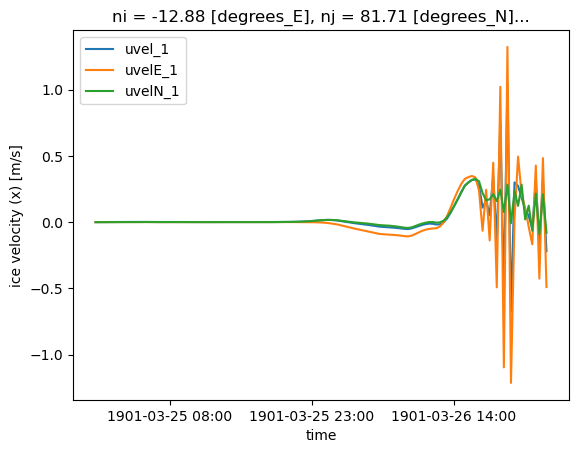

In [33]:
for v in ['uvel_1',#'vvel_1', 
          'uvelE_1', #'vvelE_1', 
          'uvelN_1', #'vvelN_1'
         ]:
    crash_point[v].sel(time=slice('1901-03-25','1901-03-26')).plot(label=v)

plt.legend()

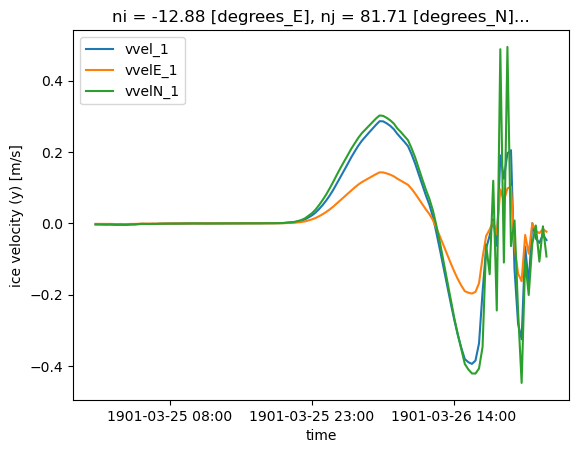

In [34]:
for v in ['vvel_1', 
          'vvelE_1', 
          'vvelN_1'
         ]:
    crash_point[v].sel(time=slice('1901-03-25','1901-03-26')).plot(label=v)

plt.legend()

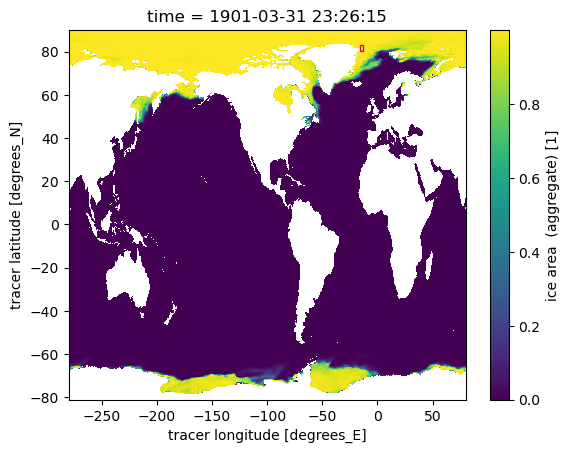

In [35]:
plt.figure()
ax = plt.subplot()

inst_ds.aice_1.isel(time=-1).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t')
# plt.ylim([75,85])
# plt.xlim([-20,-10])

ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='red', fill=None))
ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.1, height=0.1, color='black', fill=None))

plt.show()

In [36]:
times = inst_ds.aice_1.sel(time=slice('1901-03-26','1901-03-26')).time.values

In [37]:
times

array([cftime.DatetimeNoLeap(1901, 3, 26, 0, 11, 15, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 0, 33, 45, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 0, 56, 15, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 1, 18, 45, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 1, 41, 15, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 2, 3, 45, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 2, 26, 15, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 2, 48, 45, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 3, 11, 15, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 3, 33, 45, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 3, 56, 15, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 4, 18, 45, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1901, 3, 26, 4, 41, 15, 0, has_year_zero=True),


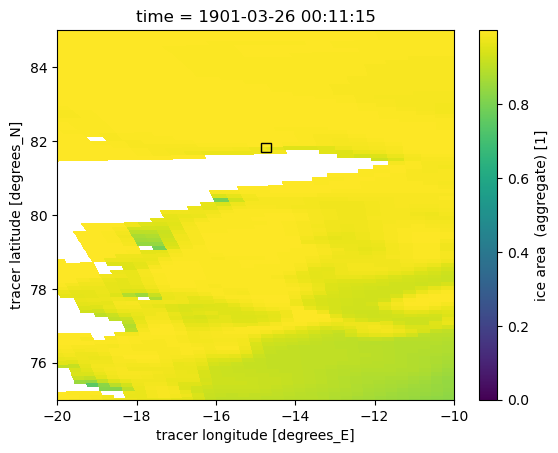

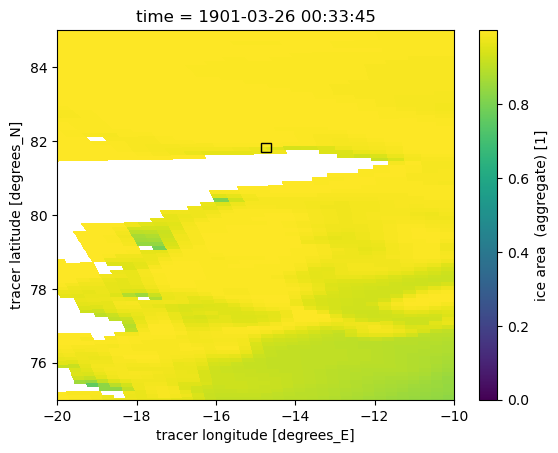

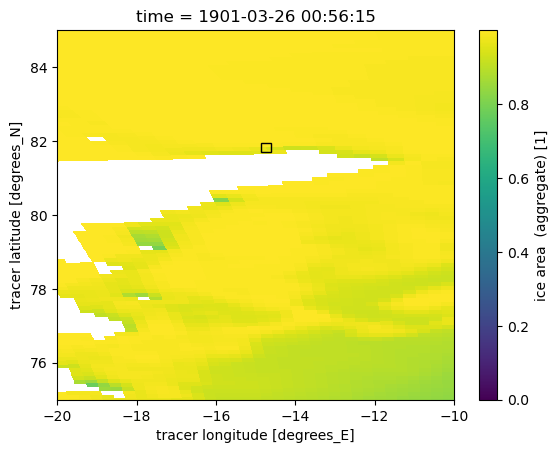

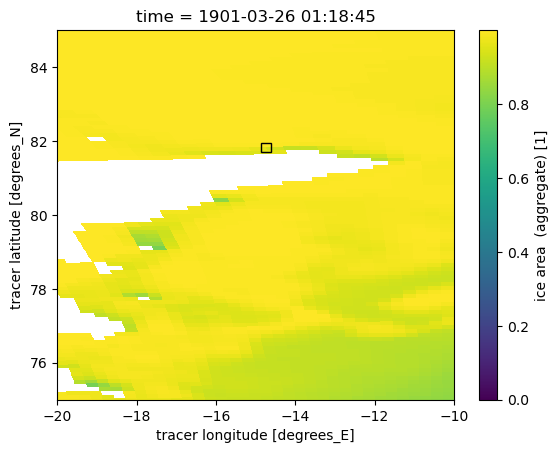

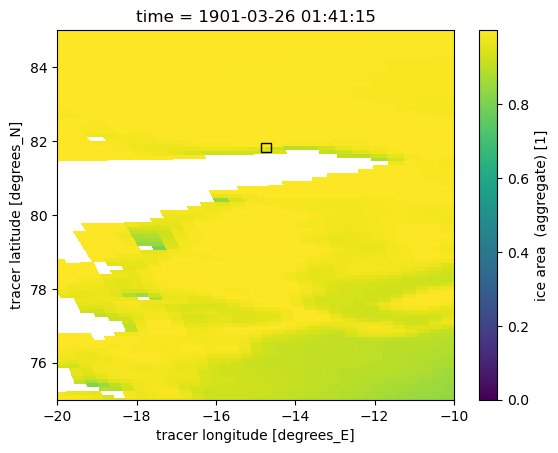

...

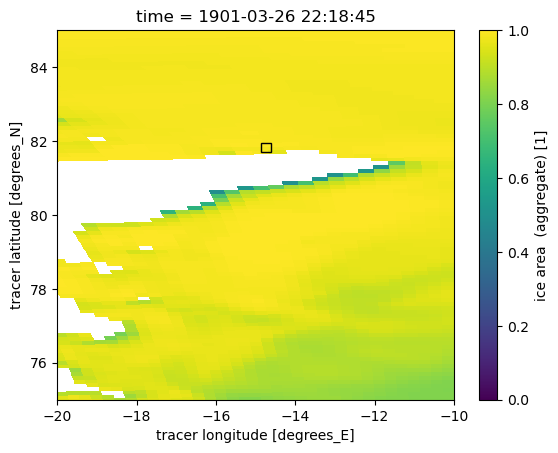

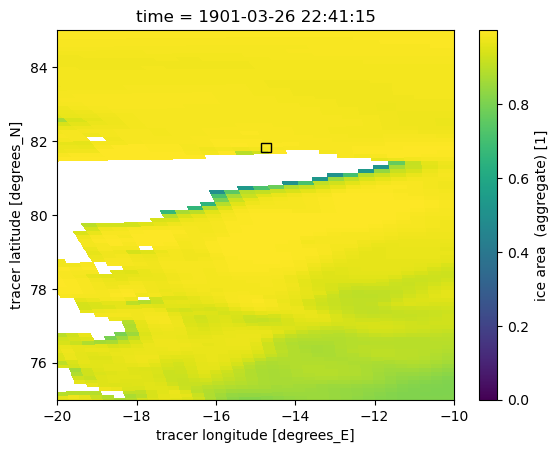

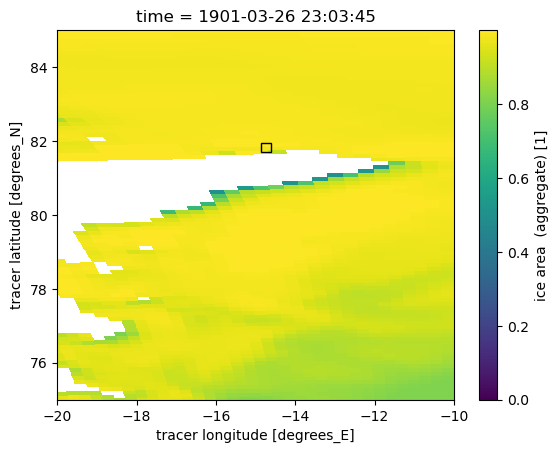

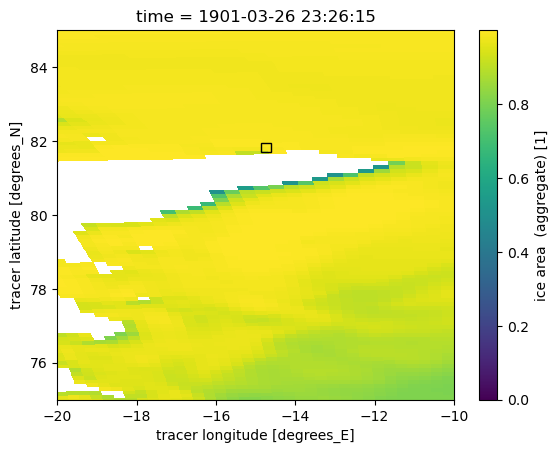

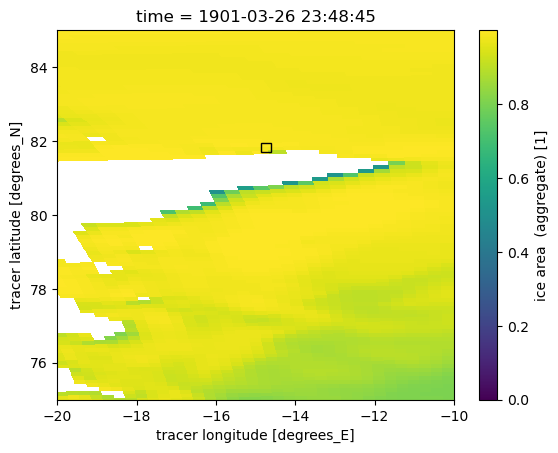

In [38]:
for t in times:
    plt.figure()
    ax = plt.subplot()
    
    inst_ds.aice_1.sel(time=t).plot(ax=ax, x='geolon_t' , y='geolat_t')
    plt.ylim([75,85])
    plt.xlim([-20,-10])
    
    # ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='black', fill=None))
    ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.25, height=0.25, color='black', fill=None))

    plt.show()


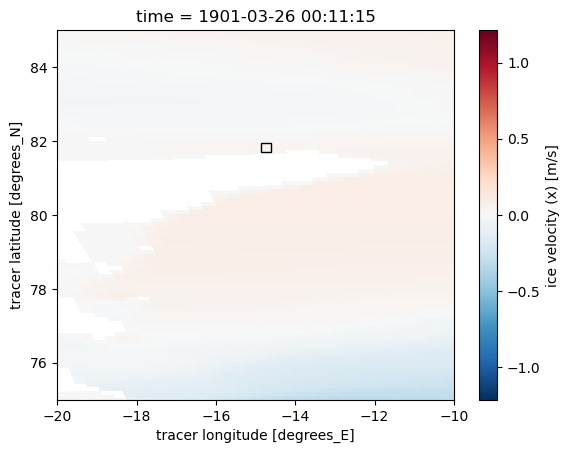

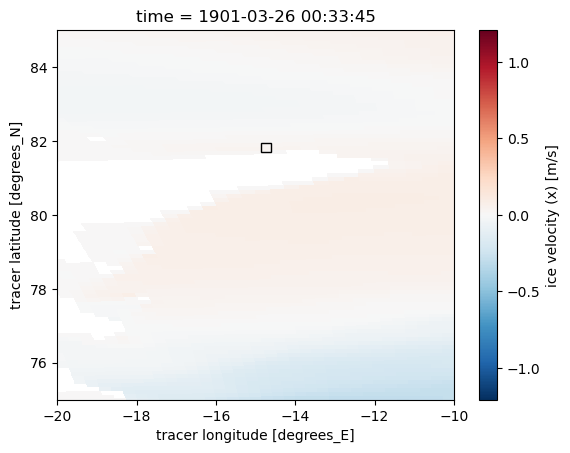

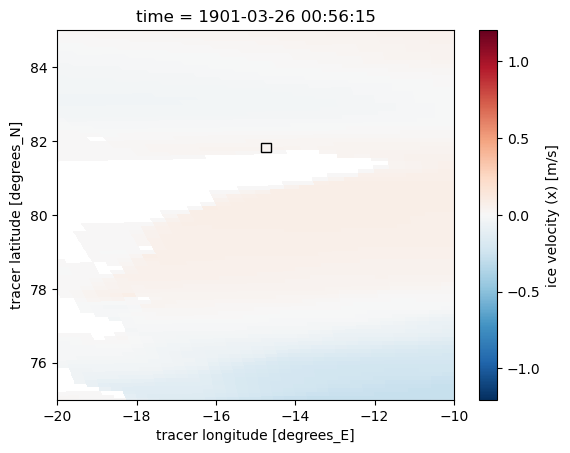

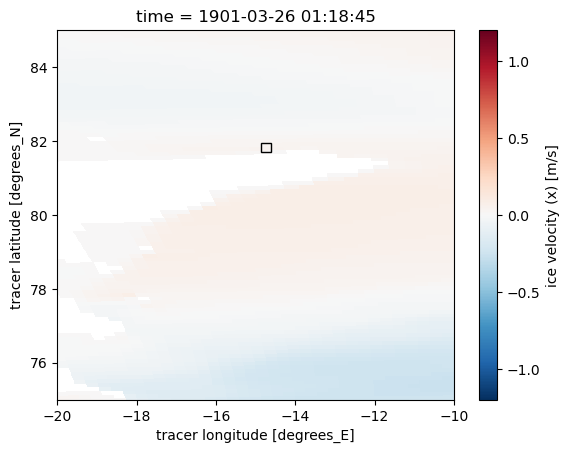

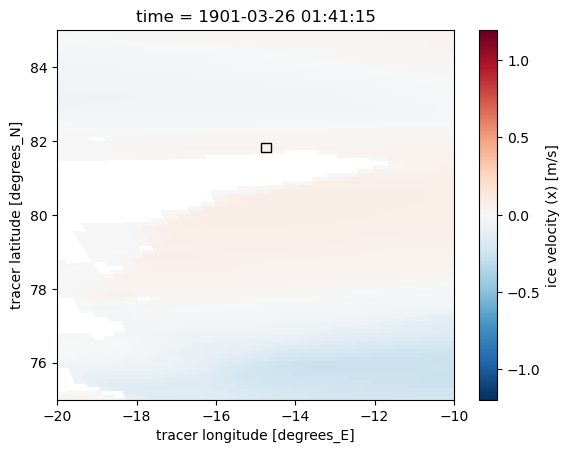

...

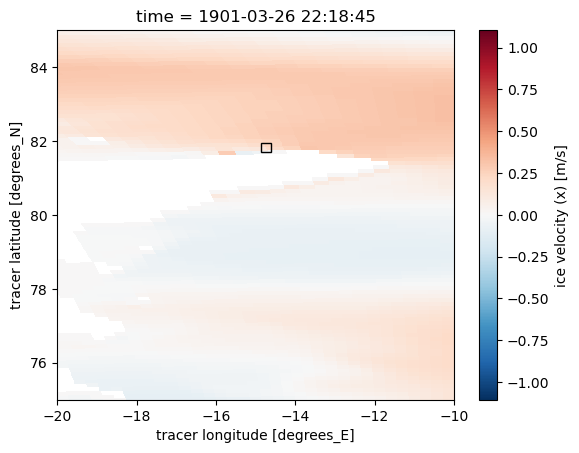

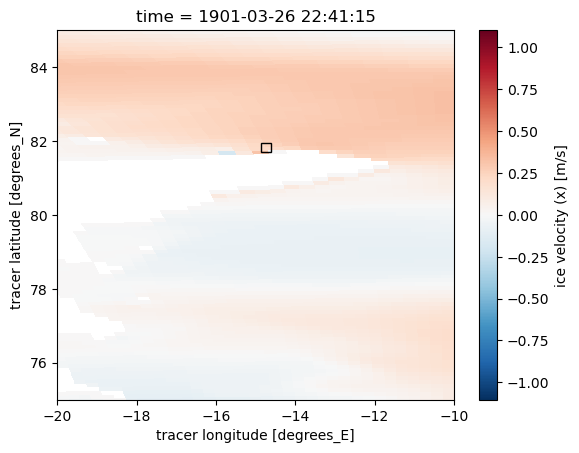

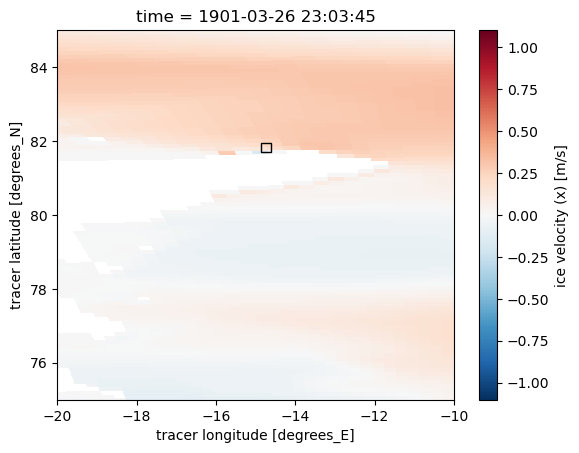

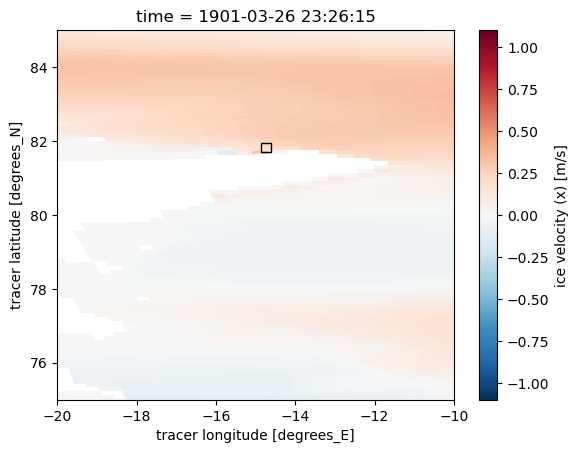

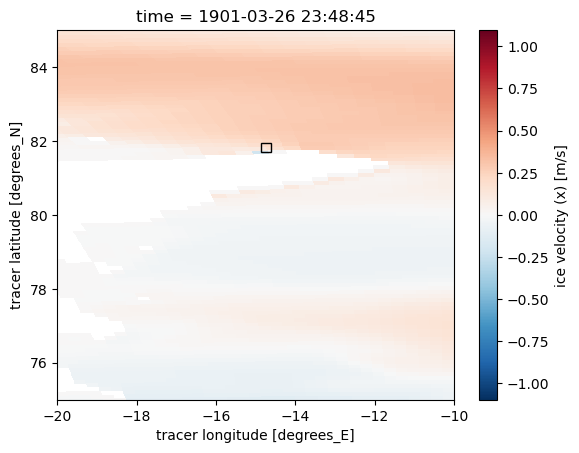

In [39]:
for t in times:
    plt.figure()
    ax = plt.subplot()
    
    inst_ds.uvel_1.sel(time=t).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t')
    plt.ylim([75,85])
    plt.xlim([-20,-10])
    
    # ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='black', fill=None))
    ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.25, height=0.25, color='black', fill=None))

    plt.show()


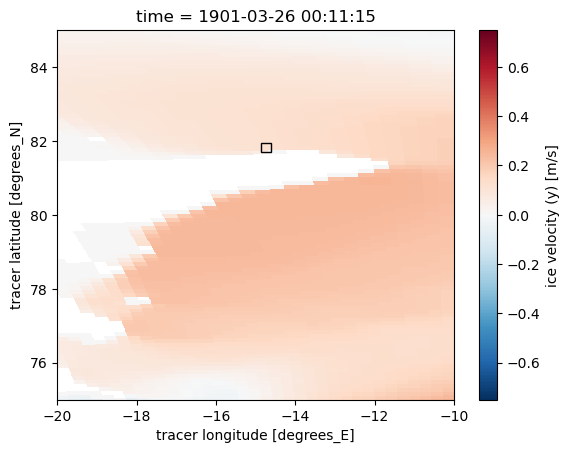

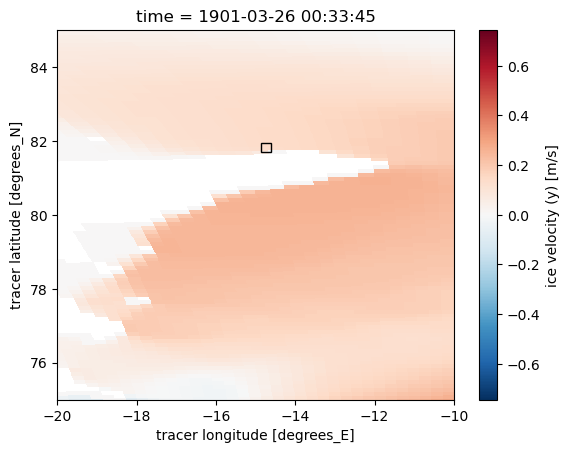

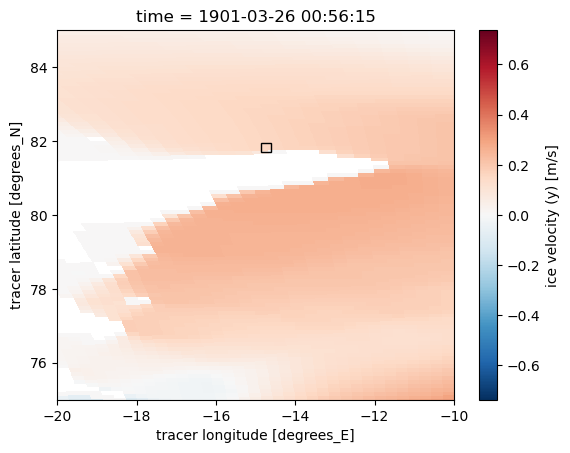

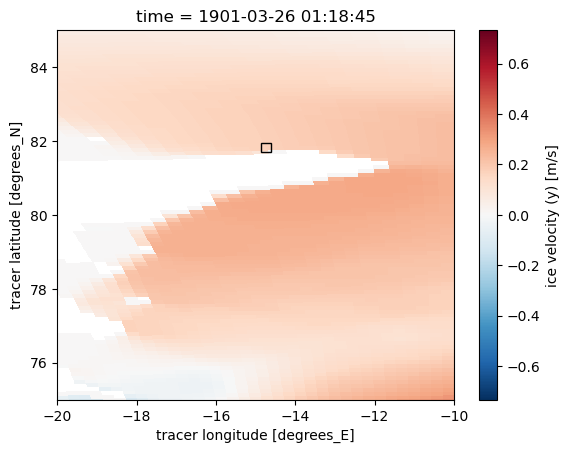

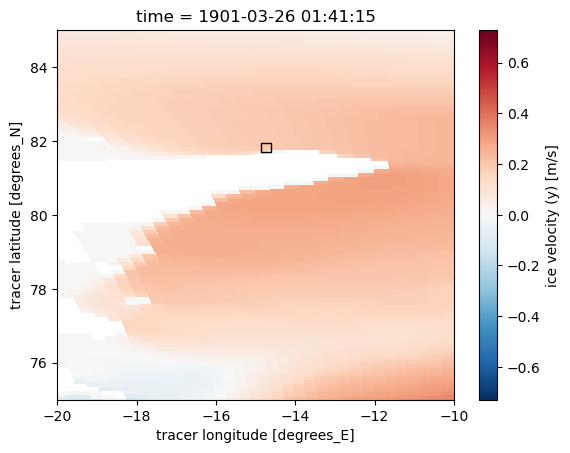

...

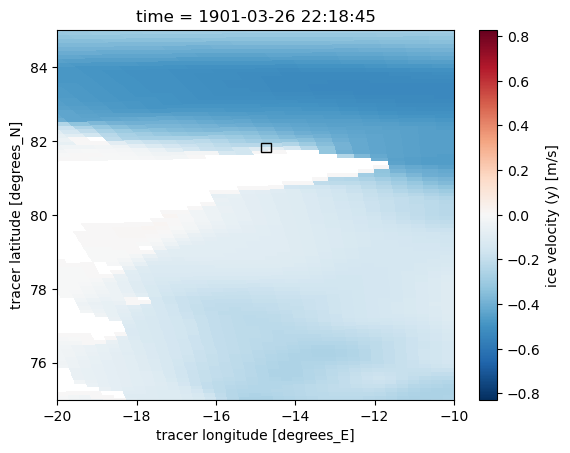

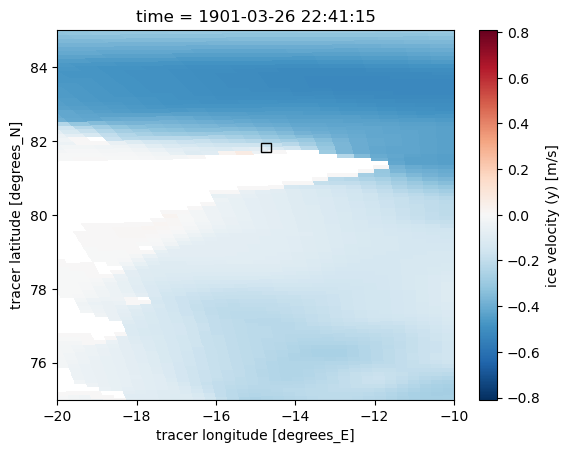

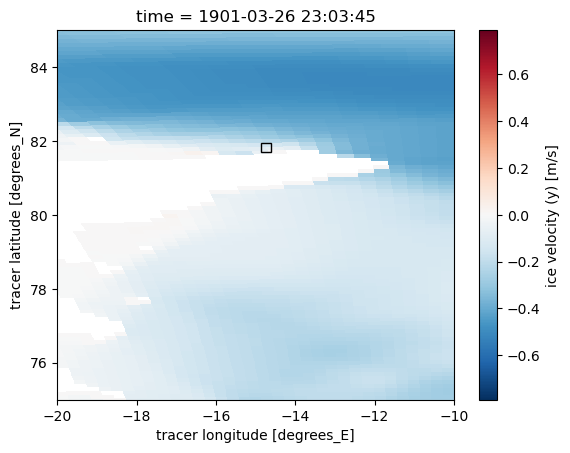

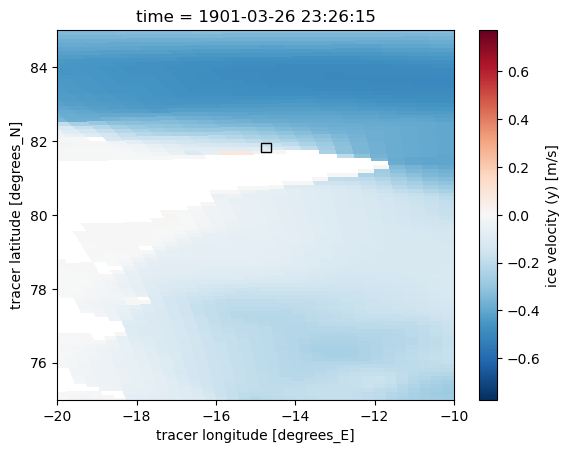

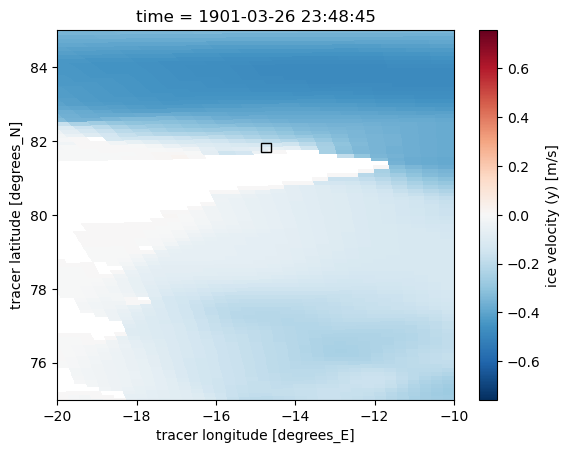

In [40]:
for t in times:
    plt.figure()
    ax = plt.subplot()
    
    inst_ds.vvel_1.sel(time=t).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t')
    plt.ylim([75,85])
    plt.xlim([-20,-10])
    
    # ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='black', fill=None))
    ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.25, height=0.25, color='black', fill=None))

    plt.show()
